In [259]:
library(Seurat)
library(harmony)
library(SeuratData)
library(ggplot2)
library(patchwork)
library(mclust)
library(aricode)
library(dplyr)
library(ggsci)
library(ggthemr)
dirs="/data02/tguo/space_batch_effect/mouse_OB/"

预处理

In [26]:
# obj<-readRDS(paste(dirs,"origin/subset_obj_anno_0723.rds",sep=""))
# samples=c("BGI","SlideV2")
# count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat.csv",sep=""),header=T,row.names=1,sep=',')
# vf=colnames(count)
# VariableFeatures(obj)<-intersect(rownames(obj@assays$RNA@counts),vf)
# obj<-FindVariableFeatures(obj,nfeatures=5000)
# obj<-ScaleData(obj)
# obj<-RunPCA(obj,npcs=50)
# obj<-RunUMAP(obj,dims=1:50)

# vf1<-intersect(rownames(obj@assays$RNA@counts),vf)
# mat1<-obj@assays$RNA@data[vf1,]
# vf2<-setdiff(vf,vf1)
# mat2<-matrix(0,nrow=length(vf2),ncol=dim(mat1)[2])
# rownames(mat2)<-vf2
# colnames(mat2)<-colnames(mat1)
# mat1<-as.matrix(mat1)
# mat<-rbind(mat1,mat2)
# mat<-t(mat)
# mat<-mat[,vf]
# write.csv(mat,paste(dirs,"gtt_input/scRNA_mat.csv",sep=""))
# meta=data.frame(celltype=obj$new_anno,batch='scRNA')
# write.csv(meta,paste(dirs,"gtt_input/scRNA_meta.csv",sep=""))

Centering and scaling data matrix

PC_ 1 
Positive:  Tmsb10, Ptma, Sox11, Igfbpl1, Cd24a, Sox4, Stmn1, H3f3a, Marcksl1, Tubb2b 
	   Ftl1, Stmn2, Nfib, Rplp0, Tuba1a, Hn1, Rpl39, Rps9, Btg1, Rpl23a 
	   Rps24, H3f3b, Ubb, Rpl26, Rpl32, Rps5, Rps4x, Rpl18a, Rplp2, Nnat 
Negative:  Syt1, Snhg11, Epha5, Atp1b1, Atp1a3, C1qtnf4, Itm2b, Gria2, Grin2b, Nptn 
	   Atp1a1, Serpini1, Caly, Scg2, Atp2b1, Psap, Itm2c, Sv2a, Atp2b2, Grin1 
	   R3hdm1, Syp, Ano3, Shisa8, Plppr4, 4430402I18Rik, Cx3cl1, Ptprn, App, Selm 
PC_ 2 
Positive:  Gng13, S100a5, mt-Nd5, mt-Nd4l, Mbp, Apoe, Acbd7, Fabp7, Dbi, Omp 
	   1700012B09Rik, Doc2g, S100b, Pth2, Aldoc, Mobp, Mt1, Stoml3, 1110017D15Rik, Efcab10 
	   Fam213b, Atf5, Tstd1, Mt2, Glul, Plekhb1, Nrn1l, mt-Atp8, mt-Nd6, S100a1 
Negative:  H3f3b, Malat1, Meg3, H3f3a, Marcksl1, Sumo2, Tubb3, Tuba1a, Btg1, Sox4 
	   Hmgb1, Dpysl2, Actg1, Cirbp, Ptma, Hnrnpk, Cfl1, Ywhae, Eif4a1, H2afz 
	   Meis2, Rtn1, Prdx2, Basp1, Morf4l1, Celf4, Bex2, Stmn1, Tubb5, Pebp1 
PC_ 3 

In [177]:
obj1<-readRDS(paste(dirs,"origin/mouse_OB_BGI_bin50.rds",sep=''))
obj2<-readRDS(paste(dirs,"origin/slide_seq2_mouse_OB.rds",sep=''))
obj3<-readRDS(paste(dirs,"origin/10X_mouse_OB.rds",sep=''))
obj<-readRDS(paste(dirs,"origin/subset_obj_anno_0723.rds",sep=""))

# obj1<-FindVariableFeatures(obj1,nfeatures=3000)
# obj2<-FindVariableFeatures(obj2,nfeatures=3000)
# obj3<-FindVariableFeatures(obj3,nfeatures=3000)
# obj<-FindVariableFeatures(obj,nfeatures=3000)
# vf1<-VariableFeatures(obj1)
# vf2<-VariableFeatures(obj2)
# vf3<-VariableFeatures(obj3)
# vf4<-VariableFeatures(obj)
allgene<-intersect(intersect(intersect(rownames(obj1@assays$Spatial@counts),rownames(obj2@assays$Spatial@counts)),rownames(obj@assays$RNA@counts)),rownames(obj@assays$RNA@counts))
vf<-union(union(union(vf1,vf2),vf4),vf4)
vf<-intersect(vf,allgene)
mat1<-t(as.matrix(obj1@assays$Spatial@counts[vf,]))
mat2<-t(as.matrix(obj2@assays$Spatial@counts[vf,]))
# mat3<-t(as.matrix(obj3@assays$Spatial@counts[vf,]))
mat4<-t(as.matrix(obj@assays$RNA@counts[vf,]))



In [300]:
# obj<-readRDS(paste(dirs,"origin/mouse_OB_BGI_bin14_matrix.rds",sep=""))
# obj<-NormalizeData(obj)

In [306]:
# samples=c("BGI","SlideV2")
# count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat.csv",sep=""),header=T,row.names=1,sep=',')
# vf=colnames(count)
# coord=obj@images$slice1@coordinates[,c(4,5)]
# mat=obj@assays$Spatial@data
colnames(coord)<-c('x','y')

In [308]:
vf=colnames(count)
idx=which(vf%in%setdiff(vf,rownames(mat)))
a=vf[idx]
vf1=c()
idx1=c()
for(i in 1:length(a)){
    a1=strsplit(a[i],'\\.')[[1]]
    if(length(a1)>1){
        b=a1[1]
        for(j in 2:length(a1)){
            b=paste(b,'-',a1[j],sep='')
        }
        vf1<-c(vf1,b)
        idx1<-c(idx1,i)
    }
}
idx2=idx[-idx1]
a=vf[idx2]
vf2=data.frame(vapply(a,function(x){strsplit(x,'X')[[1]][2]},FUN.VALUE='1'))[,1]
vf[idx[idx1]]=vf1
vf[idx2]=vf2
vf[vf=='H2-M10-3']='H2-M10.3'
mat1=mat[vf,]
write.csv(t(as.matrix(mat1)),paste(dirs,'gtt_input/BGI_bin14_mat.csv',sep=""))
write.csv(coord,paste(dirs,'gtt_input/BGI_bin14_coord.csv',sep=""))
meta=data.frame(celltype=rep(0,times=dim(coord)[1]),batch=rep('BGI_Bin14',times=dim(coord)[1]))
rownames(meta)<-rownames(coord)
write.csv(meta,paste(dirs,'gtt_input/BGI_bin14_meta.csv',sep=""))

In [189]:
# write.csv(mat1,paste(dirs,"gtt_input/BGI_mat_seurat.csv",sep=""))
# write.csv(mat2,paste(dirs,"gtt_input/SlideV2_mat_seurat.csv",sep=""))
# # write.csv(mat3,paste(dirs,"gtt_input/10X_mat_seurat.csv",sep=""))
# write.csv(mat,paste(dirs,"gtt_input/scRNA_mat_seurat.csv",sep=""))
# meta1=data.frame(celltype=obj1$annotation,batch='BGI')
# meta2=data.frame(celltype=obj2$annotation,batch='SlideV2')
# meta4=data.frame(celltype=obj$new_anno,batch='scRNA')
# write.csv(meta1,paste(dirs,"gtt_input/BGI_meta_seurat.csv",sep=""))
# write.csv(meta2,paste(dirs,"gtt_input/SlideV2_meta_seurat.csv",sep=""))
# write.csv(meta4,paste(dirs,"gtt_input/scRNA_meta_seurat.csv",sep=""))

other methods

In [190]:
# samples=c("BGI","SlideV2")
# count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat.csv",sep=""),header=T,row.names=1,sep=',')
# meta=read.csv(paste(dirs,'gtt_input/',samples[1],"_meta.csv",sep=""),header=T,row.names=1,sep=',')
# flags=paste("_",samples[1],sep="")
# for(i in 2:length(samples)){
#     count=rbind(count,read.csv(paste(dirs,'gtt_input/',samples[i],"_mat.csv",sep=""),header=T,row.names=1,sep=','))
#     meta=rbind(meta,read.csv(paste(dirs,'gtt_input/',samples[i],"_meta.csv",sep=""),header=T,row.names=1,sep=','))
#     flags=paste(flags,"_",samples[i],sep="")
# }
# count=as(t(count),'dgCMatrix')


samples=c("BGI","SlideV2")
count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat_seurat.csv",sep=""),header=T,row.names=1,sep=',')
meta=read.csv(paste(dirs,'gtt_input/',samples[1],"_meta_seurat.csv",sep=""),header=T,row.names=1,sep=',')
flags=paste("_",samples[1],sep="")
for(i in 2:length(samples)){
    count=rbind(count,read.csv(paste(dirs,'gtt_input/',samples[i],"_mat_seurat.csv",sep=""),header=T,row.names=1,sep=','))
    meta=rbind(meta,read.csv(paste(dirs,'gtt_input/',samples[i],"_meta_seurat.csv",sep=""),header=T,row.names=1,sep=','))
    flags=paste(flags,"_",samples[i],sep="")
}
count=as(t(count),'dgCMatrix')

PC_ 1 
Positive:  Malat1, Cmss1, Nrxn3, Snap25, Nme7, Calm1, Actb, Plp1, Tuba1a, Calm2 
	   Pcp4, Gad1, Ptgds, mt.Nd6, Syt1, Hsp90ab1, Celf2, Cpe, Dlgap1, Atp1b1 
	   Ndrg4, Itm2b, Meis2, Ptprd, Sparcl1, Atp1a2, Slc25a4, Cadm2, Ndufa4, Dlg2 
Negative:  Gm29483, Bglap, Rnase12, Gm12843, Ly6k, Gm37751, Mageb3, Olfr491, Tgtp2, Gm37748 
	   E130218I03Rik, Gm1992, Olfr212, X1700030C14Rik, Olfr1229, Dkk1, Krtap28.13, Otor, Gm16104, Tex16 
	   Pmch, X2700016F22Rik, Gm17025, G430095P16Rik, Gm33533, Ttc30a2, X9230117E06Rik, Ntn5, Tescl, Tmem150cos 
PC_ 2 
Positive:  Ptgds, Hbb.bs, Atp1a2, Apod, Malat1, Ptn, Fabp7, Plp1, Hba.a1, Hbb.bt 
	   S100a5, Nnat, Hba.a2, Glul, Gng13, Mgp, Igf2, Npy, Dbi, Sparcl1 
	   Igfbp2, Vtn, Rbp1, Alcam, Trpm3, Kctd12, B2m, Cd63, Sparc, mt.Nd5 
Negative:  Nrxn3, Snap25, Nme7, Pcp4, Gad1, Calm2, Syt1, Ndrg4, Meis2, Celf2 
	   Ppp3ca, Atp1b1, Calm1, Dlgap1, Pbx1, Camk2b, Kcnd2, Hsp90ab1, Rtn4, Synpr 
	   Atp2b1, Dlg2, Fam171b, Gria2, Ndufa4, Tubb2a, Gng4, Tuba1a, Cadm

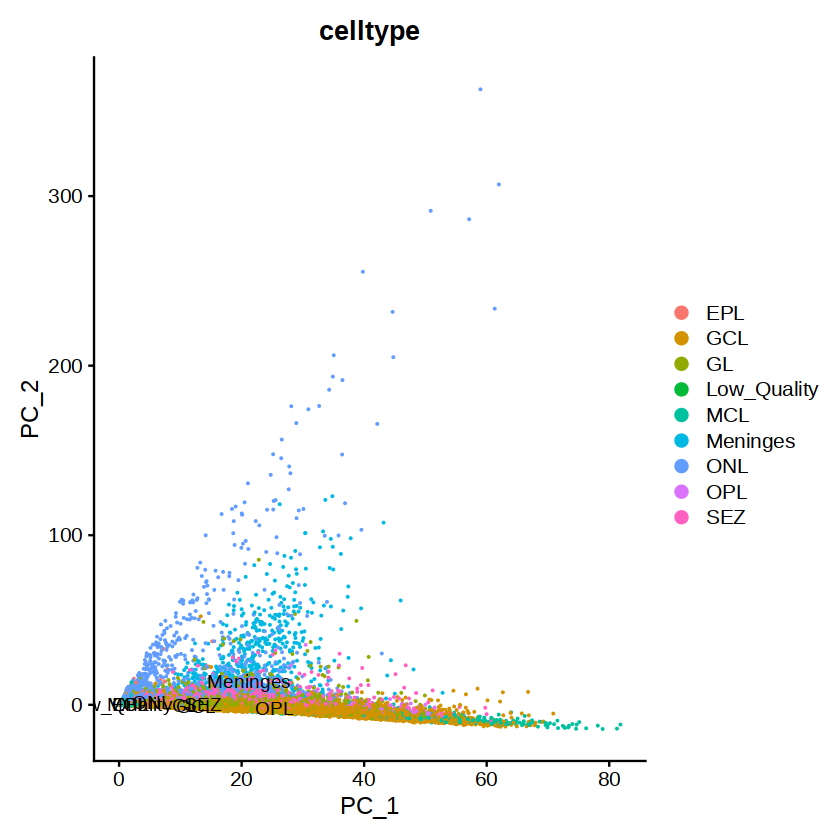

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 27682 anchors

Filtering anchors

	Retained 3184 anchors



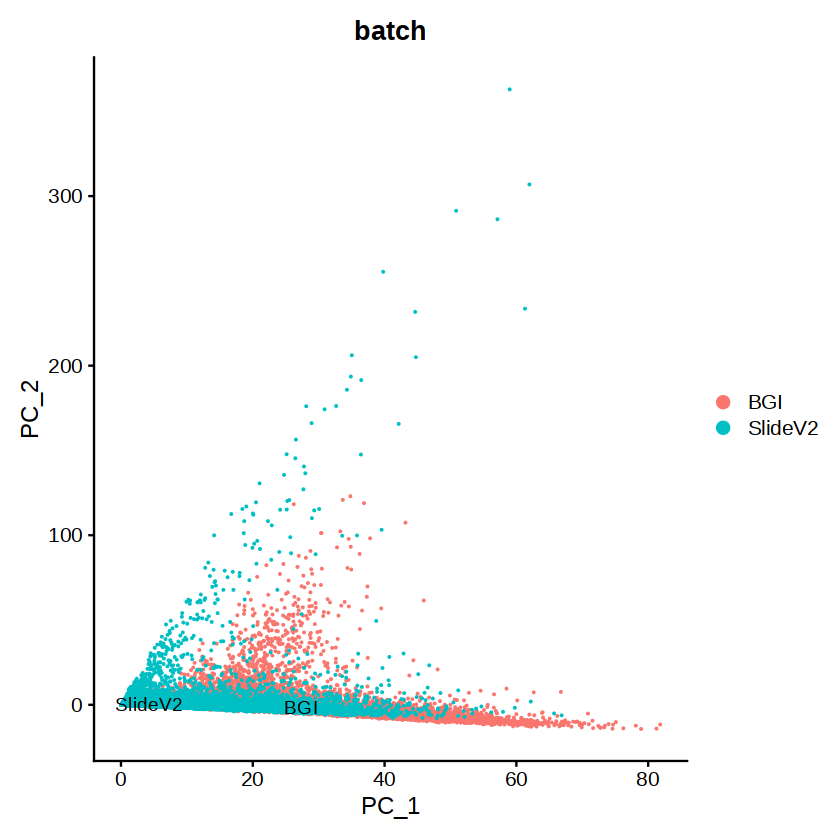

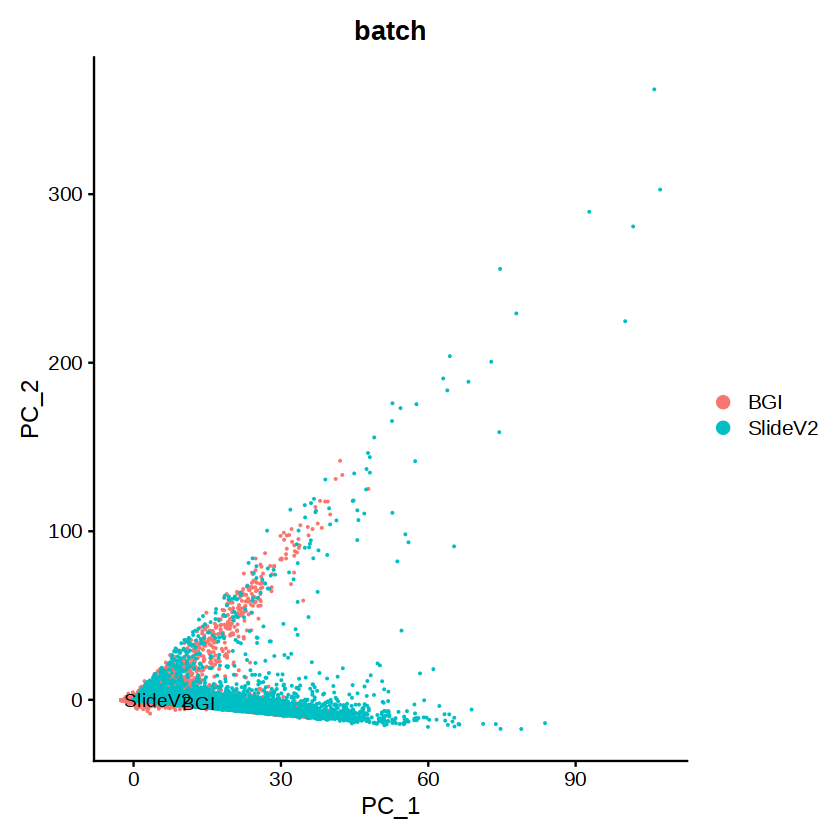

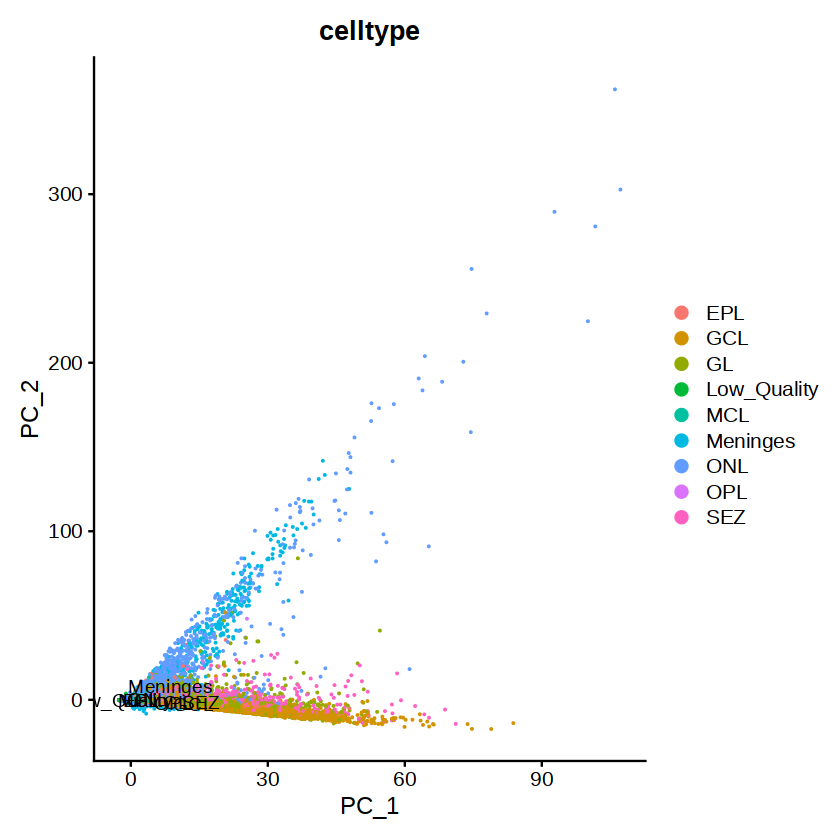

In [191]:
######seurat##########
dl<-CreateSeuratObject(counts=count,min.cells=0, min.features=0,meta.data=meta)
VariableFeatures(dl)<-rownames(dl)
dl@assays$RNA@scale.data=as.matrix(count)
# dl<-ScaleData(dl)
dl<-RunPCA(dl,npcs=30)
# dl<-RunUMAP(dl,reduction='pca',dims=1:30)
DimPlot(dl,group.by='celltype',label=T)
DimPlot(dl,group.by='batch',label=T)
dl.list<-SplitObject(dl, split.by = "batch")
# features<-SelectIntegrationFeatures(object.list=dl.list)
features<-rownames(dl)
obj.anchors<-FindIntegrationAnchors(object.list = dl.list, anchor.features = features)
obj.inte<-IntegrateData(anchorset=obj.anchors,dims=1:30,verbose=F,k.weight=100)
# obj.inte<-ScaleData(obj.inte,verbose=F)
obj.inte@assays$integrated@scale.data=as.matrix(obj.inte@assays$integrated@data)
obj.inte<-RunPCA(obj.inte,npcs=30,verbose=F)
# obj.inte<-RunUMAP(obj.inte,reduction="pca",dims=1:30,verbose=F)
DimPlot(obj.inte,group.by="batch",label=T)
DimPlot(obj.inte,group.by="celltype",label=T)
# x=as.data.frame(obj.inte@reductions$pca@cell.embeddings)
# x=x[rownames(meta),]
# write.csv(x,paste(dirs,"methods/seurat_mat",flags,".txt",sep=""))
# x=t(as.data.frame(obj.inte@assays$integrated@data))
# x=x[rownames(meta),]
# write.csv(x,paste(dirs,"methods/seurat_expression",flags,".txt",sep=""))



In [ ]:
obj.inte<-FindNeighbors(obj.inte, dims=1:50,reduction="pca")
obj.inte<-FindClusters(obj.inte, resolution = 0.5)
clust=as.data.frame(obj$seurat_clusters)

In [163]:
count1=read.csv(paste(dirs,"gtt_input/scRNA_mat_seurat.csv",sep=""),header=T,row.names=1,sep=',')
meta1=read.csv(paste(dirs,"gtt_input/scRNA_meta_seurat.csv",sep=""),header=T,row.names=1,sep=',')
count1=as(t(count1),'dgCMatrix')
dl1<-CreateSeuratObject(counts=count1,min.cells=0, min.features=0,meta.data=meta1)
VariableFeatures(dl1)<-rownames(dl1)
dl1@assays$RNA@scale.data=as.matrix(count1)
dl1<-RunPCA(dl1,npcs=30)
# clust<-read.csv(paste(dirs,'metrics/seurat_louvain_clust',flags,'.csv',sep=""),header=T,row.names=1)
obj.inte$clust<-clust[colnames(obj.inte@assays$integrated@data),1]
anchors <- FindTransferAnchors(reference = obj.inte, query = dl1,dims = 1:30, reference.reduction = "pca")
predictions <- TransferData(anchorset=anchors,refdata=as.character(obj.inte$clust),dims = 1:30)
dl1<-AddMetaData(dl1, metadata = predictions)
write.csv(as.data.frame(dl1$predicted.id),paste(dirs,"metrics/seurat_scRNA_pred_clusters.csv",sep=""))

Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 542 features requested have zero variance (running reduction without them): Hbb.bs, Hba.a1, Hba.a2, Hbb.bt, Igkc, H2.Ab1, H2.Eb1, X2010300C02Rik, H2.Aa, Gcgr, X2810455O05Rik, X6030407O03Rik, Igha, X1700056N10Rik, Srpx2, X2900079G21Rik, Mmp8, X6430571L13Rik, Zdhhc23, Gm10785, X5430427O19Rik, X1700012B09Rik, Slc6a16, X4930513N10Rik, X4930415O20Rik, X9330158H04Rik, X2700081O15Rik, Nkx2.2os, Cytl1, Alox12b, Slc6a4, Fgf22, A730081D07Rik, E130307A14Rik, X1110035H17Rik, X2700046A07Rik, X1700056E22Rik, X9930012K11Rik, X1500011B03Rik, X4632411P08Rik, X9330171B17Rik, Scn10a, X1810041H14Rik, X6030458C11Rik, Ighg2c, X2210016L21Rik, H2.Q1, X2210408I21Rik, Klhl33, X1010001B22Rik, X2700033N17Rik, Apol11b, X2610008E11Rik, X9430002A10Rik, X5330417C22Rik, X1110015O18Rik, X4933407L21Rik, Tmem45b, X2900026A02Rik, X1810030O07Rik, X5031425E22Rik, X6230400D17Rik, X2700038G22Rik, X1700012C14Rik, Gm4675, X1110008

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 2253 anchors

Filtering anchors

	Retained 841 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [14]:
library(harmony)
# #######harmony########
obj<-CreateSeuratObject(count=count,meta.data=meta)
obj@assays$RNA@scale.data=as.matrix(count)
VariableFeatures(obj)<-rownames(obj)
obj<-RunPCA(obj,npcs=30,features=rownames(obj))
obj.inte1 <- RunHarmony(obj, "batch",theta=2)
obj.inte1 <-RunUMAP(obj.inte1, reduction = "harmony",dims=1:30)
DimPlot(obj.inte1,group.by="batch")
DimPlot(obj.inte1,group.by="celltype")
x=as.data.frame(obj.inte1@reductions$harmony@cell.embeddings)
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/harmony_mat",flags,".txt",sep=""))
# ######harmony+sedr#####
# embed2=read.csv(paste(dirs,"methods/SEDR_mat",flags,".csv",sep=""),header=T,row.names=1)
# embed2=embed2[colnames(count),]
# obj[['SEDR']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "SEDR_", assay = DefaultAssay(obj))
# obj.inte2 <- RunHarmony(obj, "batch",theta=2,reduction='SEDR')
# obj.inte2 <-RunUMAP(obj.inte2, reduction = "harmony",dims=1:dim(embed2)[2])
# DimPlot(obj.inte2,group.by="batch")
# DimPlot(obj.inte2,group.by="celltype")
# x=as.data.frame(obj.inte2@reductions$harmony@cell.embeddings)
# x=x[rownames(meta),]
# write.csv(x,paste(dirs,"methods/harmony_SEDR_mat",flags,".txt",sep=""))
# # ######stagate+harmony#####
# embed3=read.csv(paste(dirs,"methods/STAGATE_mat",flags,".csv",sep=""),header=T,row.names=1)
# embed3=embed3[colnames(count),]
# obj[['STAGATE']]<-CreateDimReducObject(embeddings=as.matrix(embed3), key = "STAGATE_", assay = DefaultAssay(obj))
# obj.inte3 <- RunHarmony(obj, "batch",theta=2,reduction='STAGATE')
# obj.inte3 <-RunUMAP(obj.inte3, reduction = "harmony",dims=1:dim(embed3)[2])
# DimPlot(obj.inte3,group.by="batch")
# DimPlot(obj.inte3,group.by="celltype")
# x=as.data.frame(obj.inte3@reductions$harmony@cell.embeddings)
# x=x[rownames(meta),]
# write.csv(x,paste(dirs,"methods/harmony_STAGATE_mat",flags,".txt",sep=""))

PC_ 1 
Positive:  Malat1, Tuba1a, Fth1, Snap25, Calm2, Nrxn3, Pcp4, Atp1b1, Itm2b, Gad1 
	   Ndrg4, Plp1, Syt1, Dlgap1, Cmss1, Celf2, Meis2, Rplp1, Meg3, Atp1a2 
	   Atp5b, Tubb2a, Mdh1, Pcp4l1, Ubb, Vamp2, Cadm2, Pbx1, Camk2n1, Cox8a 
Negative:  Anxa11os, Mageb3, Gm29431, Gm28616, Otor, Gm29530, Krtap28.13, Banf2os, Dkk1, X5031434C07Rik 
	   X4930518J20Rik, X1700030C14Rik, Gm21844, Gm28610, Gm16337, Gm4128, Gm16136, Gm16541, Gm20835, X4930516K23Rik 
	   Krt17, Gm9916, Gm4744, Npy4r, Ubl4b, Gm12144, Olfr1331, Gm13389, Erich4, Grip1os2 
PC_ 2 
Positive:  Tuba1a, Rpl4, Pcp4, Ubb, Malat1, Fth1, Calm2, Pcp4l1, Rps5, Atp1b1 
	   Camk2n1, Dynll1, Gabarapl1, Rpl13, Rps3, Atp5b, Ncdn, Rps8, Mdh1, Eno2 
	   Doc2g, Rps20, Tubb2a, Stmn3, Cnbp, Rpl8, Kif5a, Nsg1, Mbp, Syp 
Negative:  Cmss1, Nme7, Ptprd, Lrp1b, Trhde, Galntl6, Cadm2, Auts2, Dlg2, Il1rapl1 
	   Gm10800, Pcdh15, Gm15564, Pde4d, Nrxn3, Lars2, Nlgn1, Kcnip4, Opcml, Zbtb20 
	   Nrxn1, Kcnd2, Shank1, Kirrel3, Lsamp, Csmd1, Cntnap2, Nav2,

ERROR: Error in do_one(nmeth): NA/NaN/Inf in foreign function call (arg 1)


下游分析

In [208]:
# samples=c("BGI","SlideV2","10X")
samples=c("BGI","SlideV2")
count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat.csv",sep=""),header=T,row.names=1,sep=',')
meta=read.csv(paste(dirs,'gtt_input/',samples[1],"_meta.csv",sep=""),header=T,row.names=1,sep=',')
coord=read.csv(paste(dirs,"gtt_input/",samples[1],"_coord.csv",sep=""),header=T,row.names=1,sep=',')
flags=paste("_",samples[1],sep="")
for(i in 2:length(samples)){
    count=rbind(count,read.csv(paste(dirs,'gtt_input/',samples[i],"_mat.csv",sep=""),header=T,row.names=1,sep=','))
    meta=rbind(meta,read.csv(paste(dirs,'gtt_input/',samples[i],"_meta.csv",sep=""),header=T,row.names=1,sep=','))
    coord=rbind(coord,read.csv(paste(dirs,"gtt_input/",samples[i],"_coord.csv",sep=""),header=T,row.names=1,sep=','))
    flags=paste(flags,"_",samples[i],sep="")
}
count=as(as.matrix(t(count)),'dgCMatrix')
obj<-CreateSeuratObject(counts=count,min.cells=0, min.features=0,meta.data=meta)
VariableFeatures(obj)<-rownames(obj)
obj@assays$RNA@scale.data=as.matrix(count)
# obj<-ScaleData(obj)
obj<-RunPCA(obj,npcs=50)
obj<-RunUMAP(obj,reduction='pca',dims=1:50)
obj@images$image <- new(
    Class = 'SlideSeq',
    assay = "Spatial",
    key = "image_",
    coordinates = coord
 )
obj<-subset(obj,subset=celltype!='Low_Quality')
obj$celltype[obj$celltype=='SEZ']='GCL'
obj$celltype[obj$celltype=='Meninges']='ONL'
obj$celltype[obj$celltype=='OPL']='EPL'
obj$celltype[obj$celltype=='GCL_1']='GCL'
obj$celltype[obj$celltype=='GCL_2']='GCL'
obj$celltype[obj$celltype=='GL_1']='GL'
obj$celltype[obj$celltype=='GL_2']='GL'
cells=colnames(obj@assays$RNA@counts)

PC_ 1 
Positive:  Malat1, Tuba1a, Snap25, Fth1, Calm2, Nrxn3, Pcp4, Atp1b1, Cmss1, Itm2b 
	   Gad1, Ndrg4, Plp1, Dlgap1, Syt1, Celf2, Meis2, Meg3, Tubb2a, Atp1a2 
	   Atp5b, Mdh1, Pcp4l1, Rplp1, Nme7, Cadm2, Pbx1, Auts2, Ppp3ca, Camk2n1 
Negative:  Gm29431, Anxa11os, Mageb3, Gm13389, Gm28616, Prickle4, Krtap28.13, Otor, Gm29530, Banf2os 
	   Gm16136, X5031434C07Rik, Dkk1, X4930518J20Rik, X1700030C14Rik, Gm21844, Krt17, Gm28610, Gm37748, Gm16337 
	   Gm4128, Gm12144, Gm16541, X4930516K23Rik, Gm20835, Gm9916, Gm4744, Npy4r, Ubl4b, Gm12326 
PC_ 2 
Positive:  Cmss1, Nme7, Ptprd, Trhde, Galntl6, Lrp1b, Atp1a2, Gm10800, Shank1, Pcdh15 
	   Gm15564, Cadm2, Kirrel3, Zbtb20, Pde4d, Kcnip4, Lars2, Opcml, Dlg2, Gm26917 
	   Nlgn1, Csmd1, Il1rapl1, Nrxn1, Auts2, Nrg3, Rora, Lsamp, Cntnap2, Magi2 
Negative:  Tuba1a, Malat1, Rpl4, Pcp4, Calm2, Fth1, Ubb, Pcp4l1, Camk2n1, Atp1b1 
	   Rps5, Gabarapl1, Dynll1, Tubb2a, Ncdn, Atp5b, Mdh1, Rps3, Kif5a, Cnbp 
	   Eno2, Nsg2, Stmn3, Basp1, Nsg1, Snap25, Doc

In [209]:
embed1=read.csv(paste(dirs,"gtt_output/AGC_embed",flags,"_xent.csv",sep=""),header=T,row.names=1)
if(dim(embed1)[2]==16){
    znoise_dim=3}else{
    znoise_dim=5
}
embed1=embed1[cells,znoise_dim:dim(embed1)[2]]
obj[['GTT']]<-CreateDimReducObject(embeddings=as.matrix(embed1), key = "GTT_", assay = DefaultAssay(obj))
obj <-RunUMAP(obj, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")
embed2=read.csv(paste(dirs,"methods/seurat_mat",flags,".txt",sep=""),header=T,row.names=1)
embed2=embed2[cells,]
obj[['Seurat']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "Seurat_", assay = DefaultAssay(obj))
embed3=read.csv(paste(dirs,"methods/harmony_mat",flags,".txt",sep=""),header=T,row.names=1)
embed3=embed3[cells,]
obj[['Harmony']]<-CreateDimReducObject(embeddings=as.matrix(embed3), key = "Harmony_", assay = DefaultAssay(obj))
embed4=read.csv(paste(dirs,"methods/harmony_SEDR_mat",flags,".txt",sep=""),header=T,row.names=1)
embed4=embed4[cells,]
obj[['SEDR']]<-CreateDimReducObject(embeddings=as.matrix(embed4), key = "SEDR_", assay = DefaultAssay(obj))
embed5=read.csv(paste(dirs,"methods/harmony_STAGATE_mat",flags,".txt",sep=""),header=T,row.names=1)
embed5=embed5[cells,]
obj[['STAGATE']]<-CreateDimReducObject(embeddings=as.matrix(embed5), key = "STAGATE_", assay = DefaultAssay(obj))

obj <-RunUMAP(obj, reduction = "Seurat",dims=1:dim(embed2)[2],reduction.name="Seurat.umap")
obj <-RunUMAP(obj, reduction = "Harmony",dims=1:dim(embed3)[2],reduction.name="Harmony.umap")
obj <-RunUMAP(obj, reduction = "SEDR",dims=1:dim(embed4)[2],reduction.name="SEDR.umap")
obj <-RunUMAP(obj, reduction = "STAGATE",dims=1:dim(embed5)[2],reduction.name="STAGATE.umap")


11:55:18 UMAP embedding parameters a = 0.9922 b = 1.112

11:55:18 Read 27299 rows and found 28 numeric columns

11:55:18 Using Annoy for neighbor search, n_neighbors = 30

11:55:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

11:55:23 Writing NN index file to temp file /tmp/RtmpAjzVBD/file25524b4caa2e

11:55:23 Searching Annoy index using 1 thread, search_k = 3000

11:55:38 Annoy recall = 100%

11:55:38 Commencing smooth kNN distance calibration using 1 thread

11:55:41 Initializing from normalized Laplacian + noise

11:55:42 Commencing optimization for 200 epochs, with 1360760 positive edges

11:56:32 Optimization finished

Warning message:
“Cannot add objects with duplicate keys (offending key: UMAP_), setting key to 'gtt.umap_'”
11:56:37 UMAP embedding parameters

In [224]:
# obj1<-subset(obj,subset=batch%in%c('BGI','SlideV2'))
res=0.5
obj<-FindNeighbors(obj, dims=1:dim(embed1)[2],reduction="GTT")
obj<-FindClusters(obj, resolution =res)
obj$gtt=obj$seurat_clusters
# obj<-FindNeighbors(obj, dims=1:dim(embed2)[2],reduction="Seurat")
# obj<-FindClusters(obj, resolution = res)
# obj$seurat=obj$seurat_clusters
# obj<-FindNeighbors(obj, dims=1:dim(embed3)[2],reduction="Harmony")
# obj<-FindClusters(obj, resolution = res)
# obj$harmony=obj$seurat_clusters
# obj<-FindNeighbors(obj, dims=1:dim(embed4)[2],reduction="SEDR")
# obj<-FindClusters(obj, resolution =res)
# obj$sedr=obj$seurat_clusters
# obj<-FindNeighbors(obj, dims=1:dim(embed5)[2],reduction="STAGATE")
# obj<-FindClusters(obj, resolution =res)
# obj$stagate=obj$seurat_clusters
# obj<-FindNeighbors(obj, dims=1:50,reduction="pca")
# obj<-FindClusters(obj, resolution =res)
# flags1='_BGI_SlideV2'
write.csv(as.data.frame(obj$gtt),paste(dirs,'metrics/louvain_clust',flags,'_1.csv',sep=""))
# write.csv(as.data.frame(obj$seurat),paste(dirs,'metrics/seurat_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$harmony),paste(dirs,'metrics/harmony_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$sedr),paste(dirs,'metrics/SEDR_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$stagate),paste(dirs,'metrics/STAGATE_louvain_clust',flags,'.csv',sep=""))

In [225]:
obj$gtt1=read.csv(paste(dirs,"metrics/louvain_clust",flags,'_1.csv',sep=""),header=T,row.names=1)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from gtt.umap_ to gttumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from seurat.umap_ to seuratumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from harmony.umap_ to harmonyumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from sedr.umap_ to sedrumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from stagate.umap_ to stagateumap_”
Warning message:
“Adding image data that isn't associated with any assay present”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



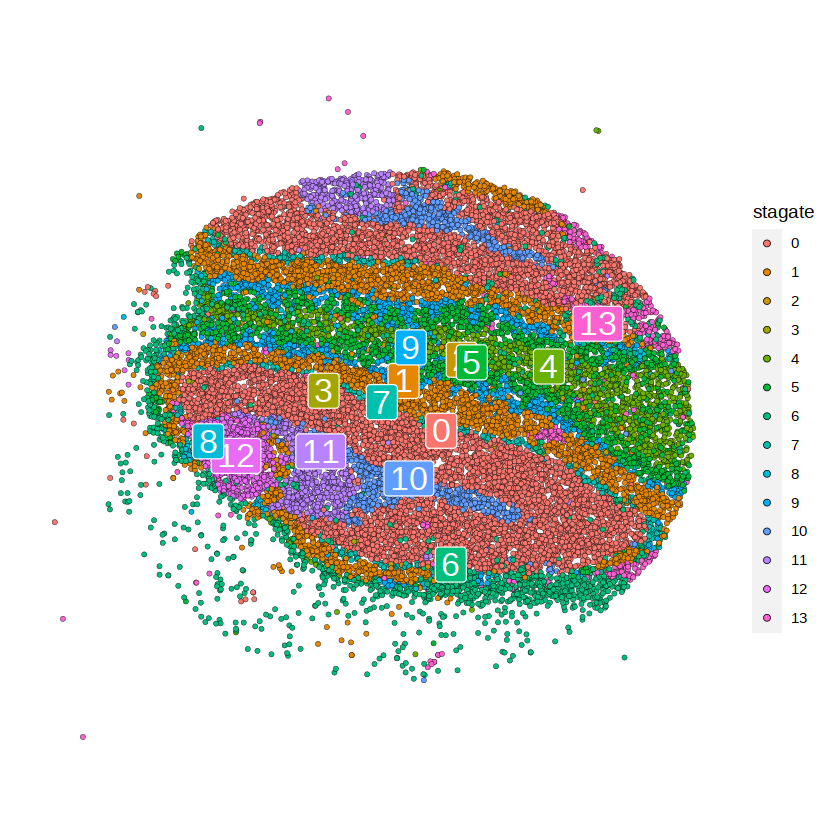

In [228]:
ub=unique(obj$batch)
obj1=subset(obj,subset=batch==ub[2])
SpatialDimPlot(obj1,group.by='stagate',label=T)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from gtt.umap_ to gttumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from seurat.umap_ to seuratumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from harmony.umap_ to harmonyumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from sedr.umap_ to sedrumap_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from stagate.umap_ to stagateumap_”
Warning message:
“Adding image data that isn't associated with any assay present”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



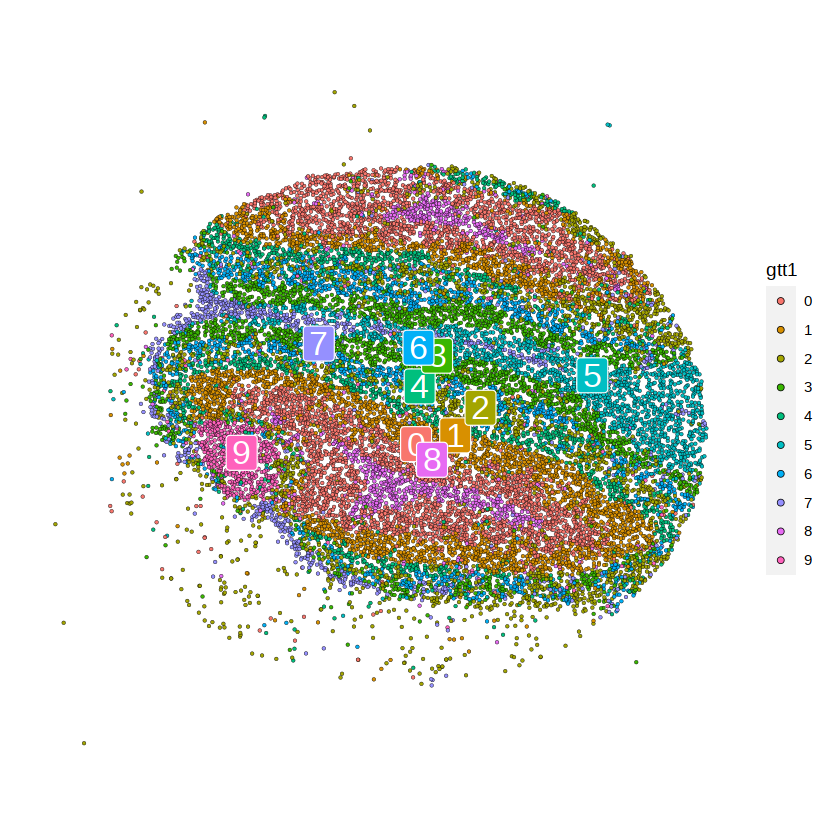

In [230]:
ub=unique(obj$batch)
obj1=subset(obj,subset=batch==ub[2])
SpatialDimPlot(obj1,group.by='gtt1',label=T,pt.size=1)

In [8]:
ari=data.frame(method=c('GraphSCIDRL','seurat','harmony_STAGATE','harmony_SEDR','harmony'),
              ARI_louvain=c(ARI(obj1$gtt,obj1$celltype),ARI(obj$seurat,obj$celltype),
                            ARI(obj$stagate,obj$celltype),
                            ARI(obj$sedr,obj$celltype),ARI(obj$harmony,obj$celltype)))
write.csv(ari,paste(dirs,'metrics/ARI_louvain',flags,'.csv',sep=""))
ari

method,ARI_louvain
<chr>,<dbl>
GraphSCIDRL,0.2901094
seurat,0.2721981
harmony_STAGATE,0.2653241
harmony_SEDR,0.1311771
harmony,0.2719470


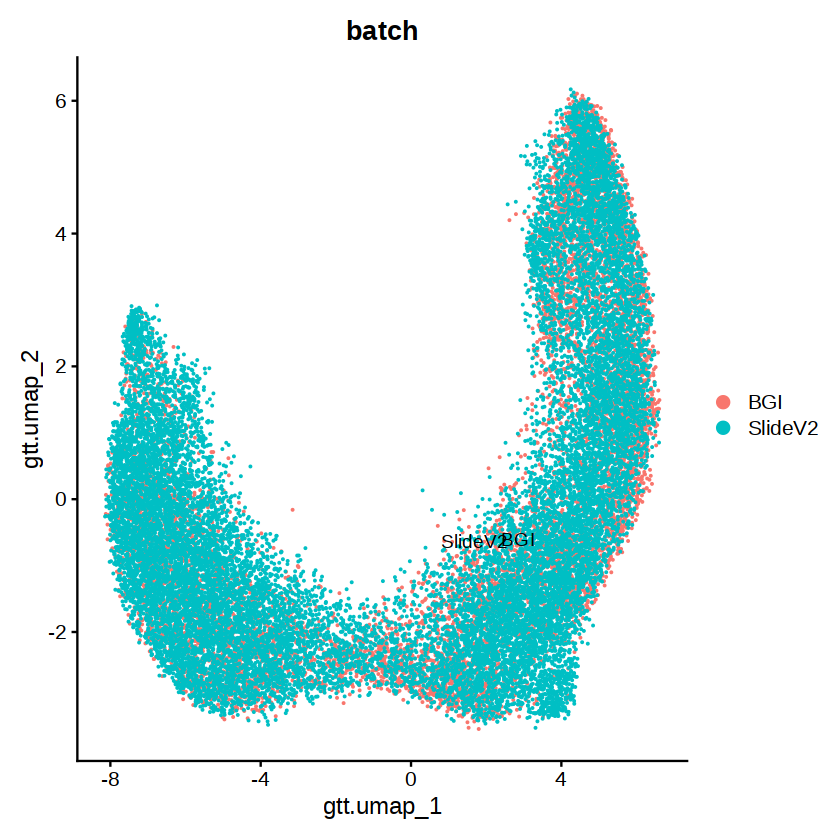

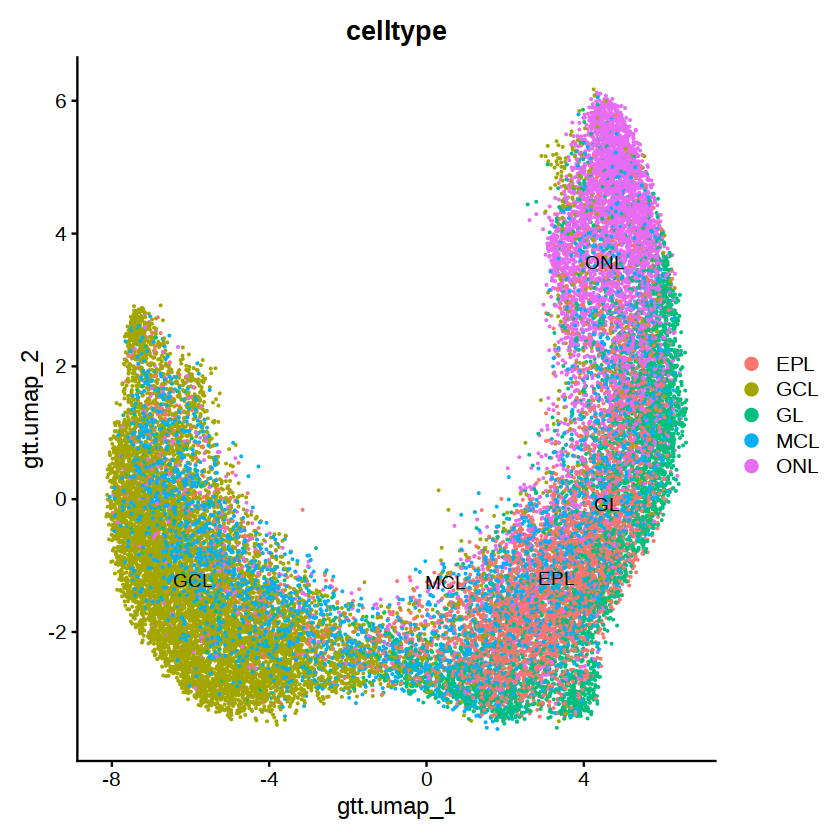

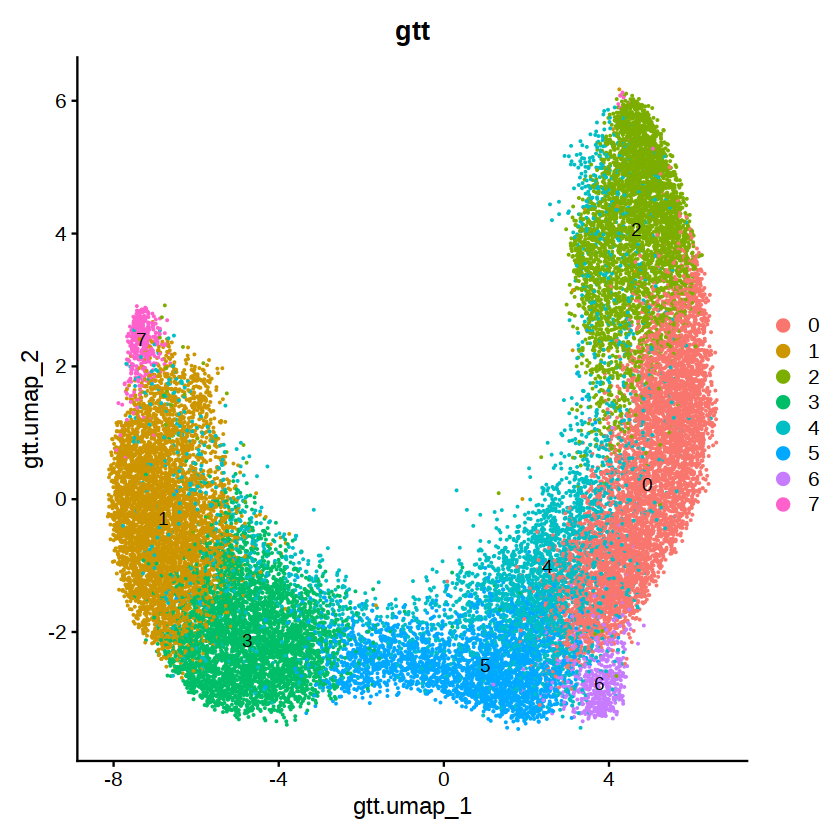

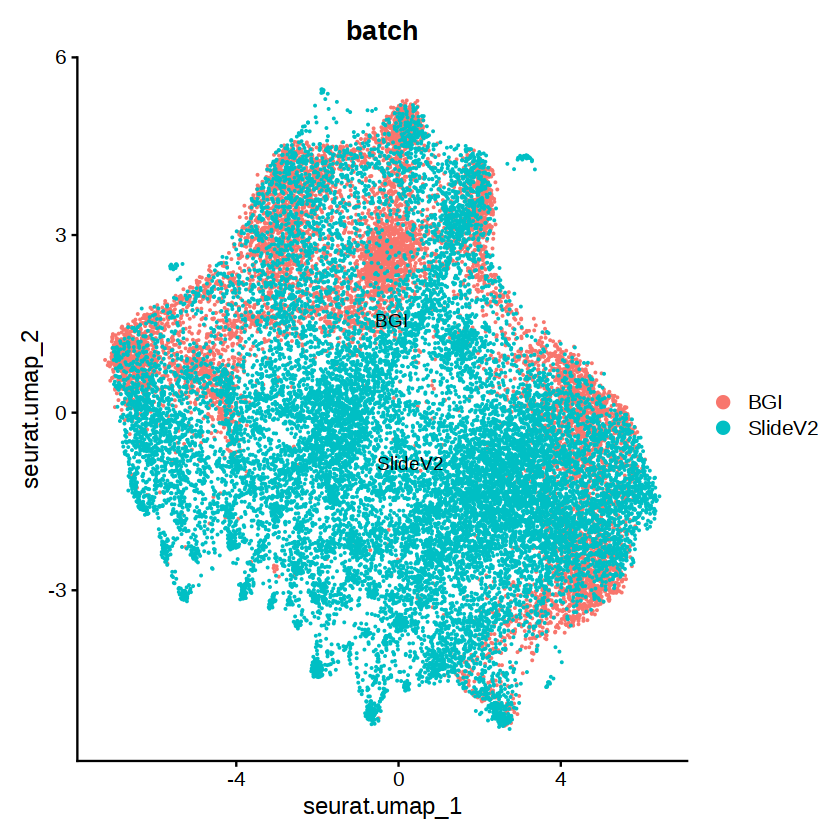

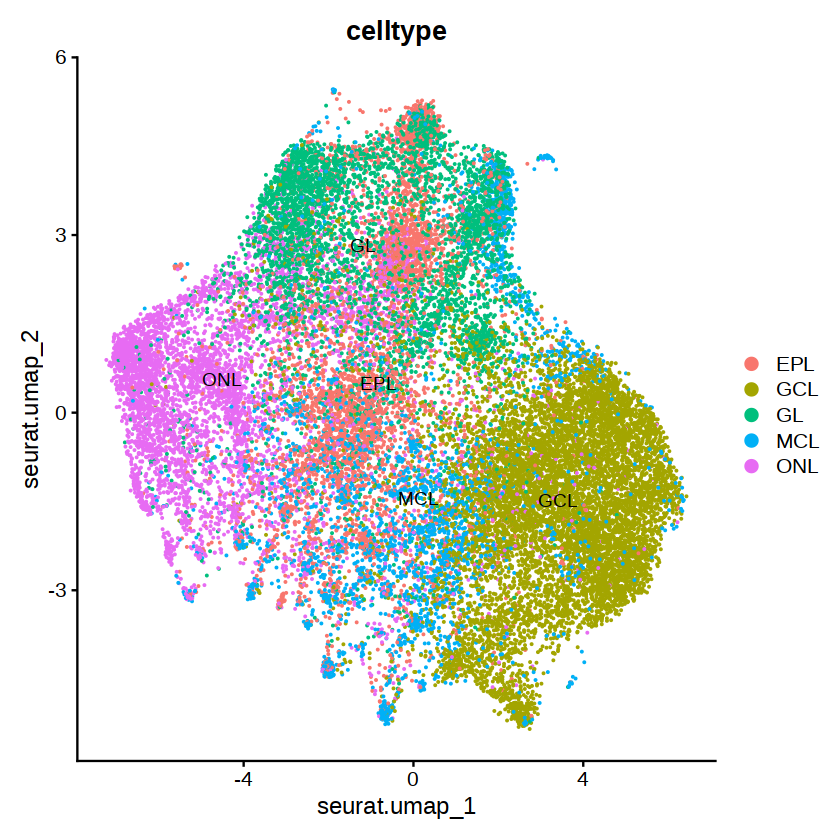

...

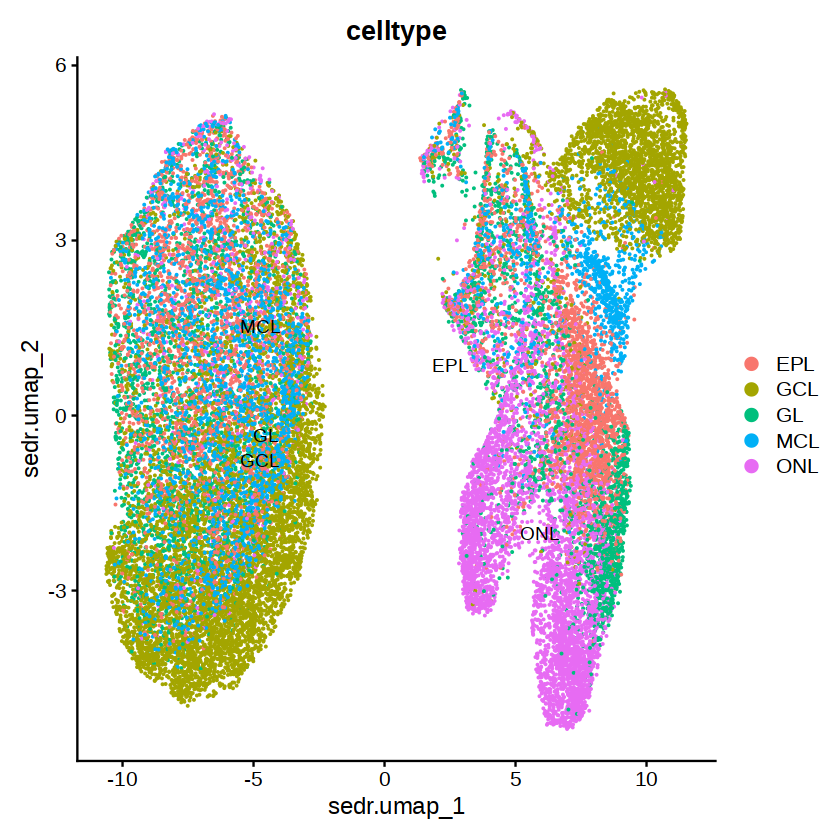

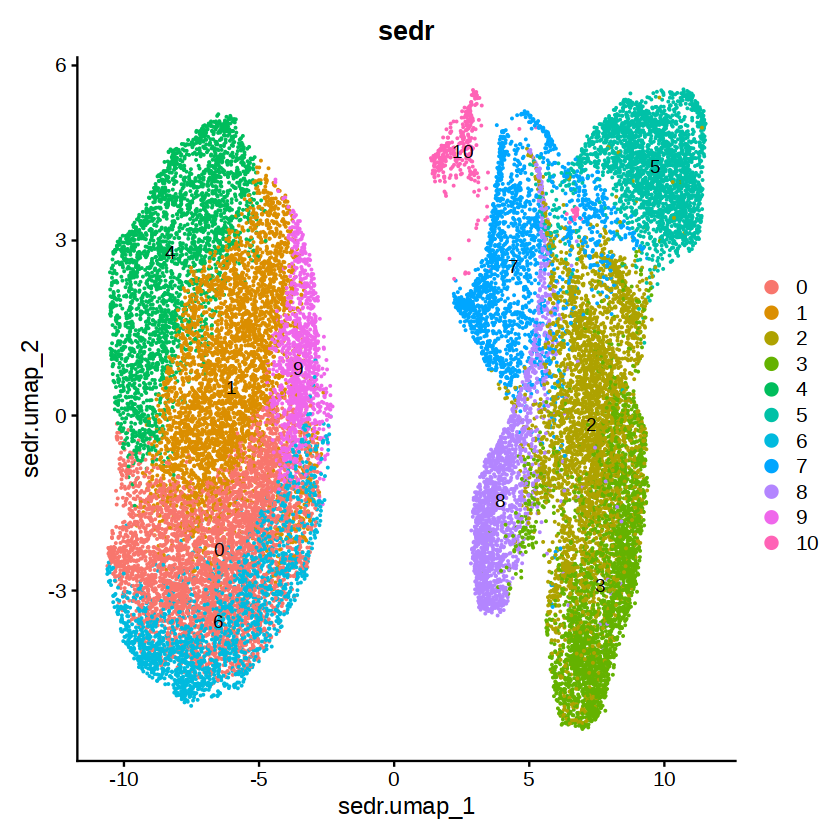

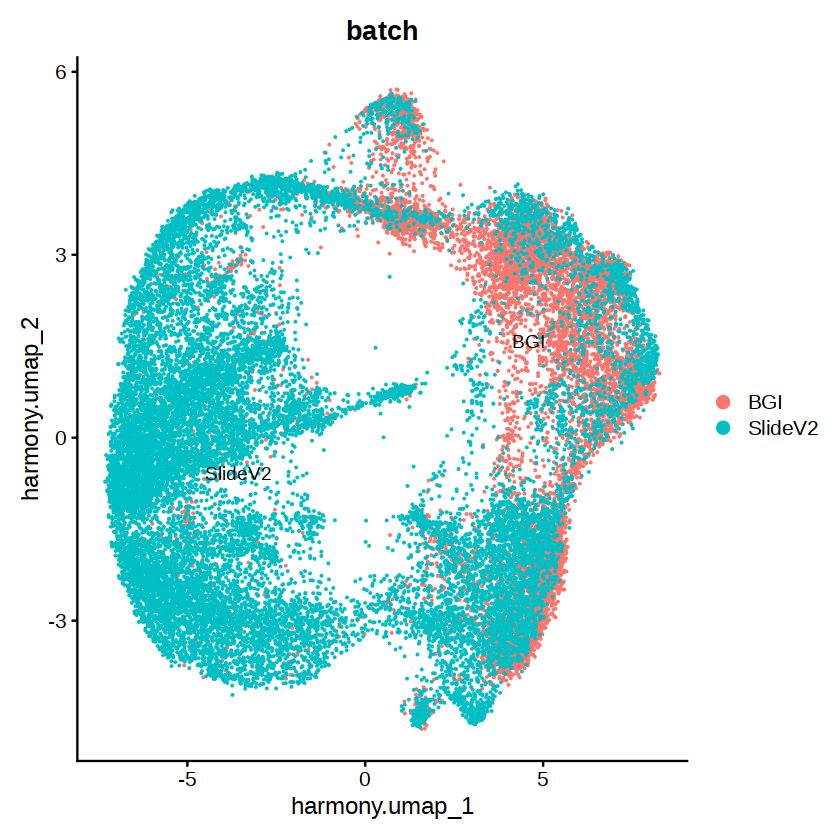

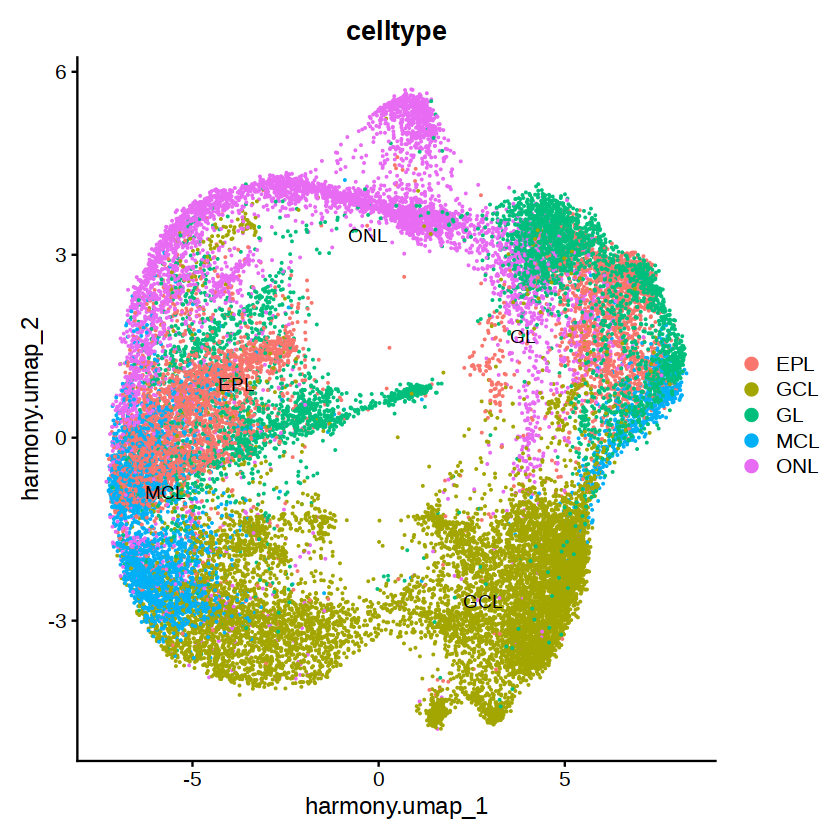

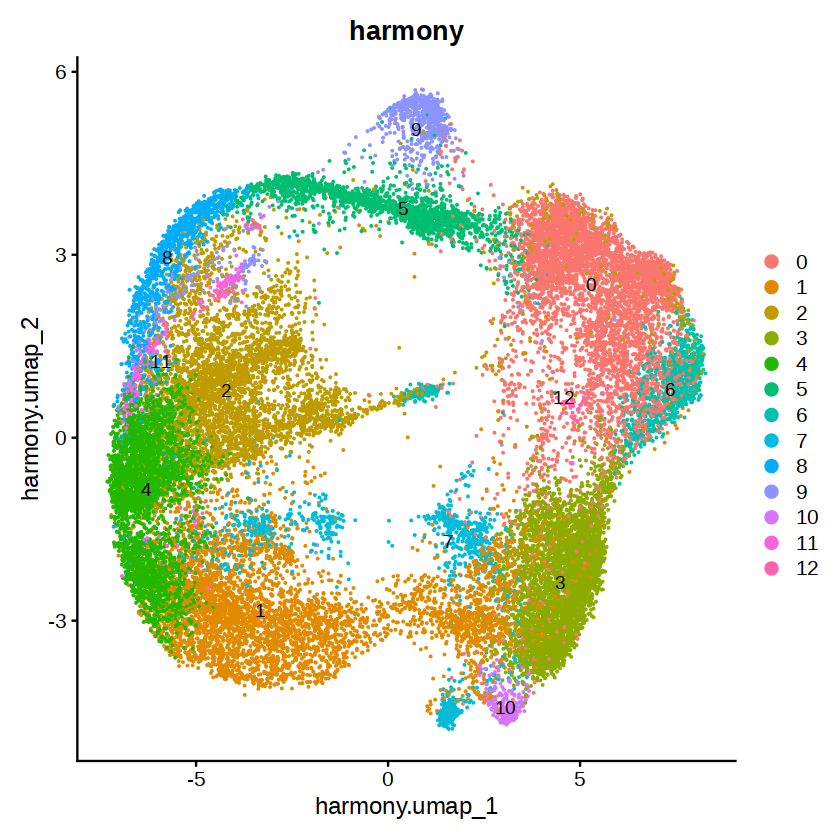

In [7]:
# DimPlot(obj1,group.by="batch",label=T,reduction='GTT.umap')
# DimPlot(obj1,group.by="celltype",label=T,reduction='GTT.umap')
# DimPlot(obj1,group.by="gtt",label=T,reduction='GTT.umap')

# DimPlot(obj,group.by="batch",label=T,reduction='Seurat.umap')
# DimPlot(obj,group.by="celltype",label=T,reduction='Seurat.umap')
# DimPlot(obj,group.by="seurat",label=T,reduction='Seurat.umap')

DimPlot(obj,group.by="batch",label=T,reduction='STAGATE.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='STAGATE.umap')
DimPlot(obj,group.by="stagate",label=T,reduction='STAGATE.umap')

# DimPlot(obj,group.by="batch",label=T,reduction='SEDR.umap')
# DimPlot(obj,group.by="celltype",label=T,reduction='SEDR.umap')
# DimPlot(obj,group.by="sedr",label=T,reduction='SEDR.umap')

# DimPlot(obj,group.by="batch",label=T,reduction='Harmony.umap')
# DimPlot(obj,group.by="celltype",label=T,reduction='Harmony.umap')
# DimPlot(obj,group.by="harmony",label=T,reduction='Harmony.umap')

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


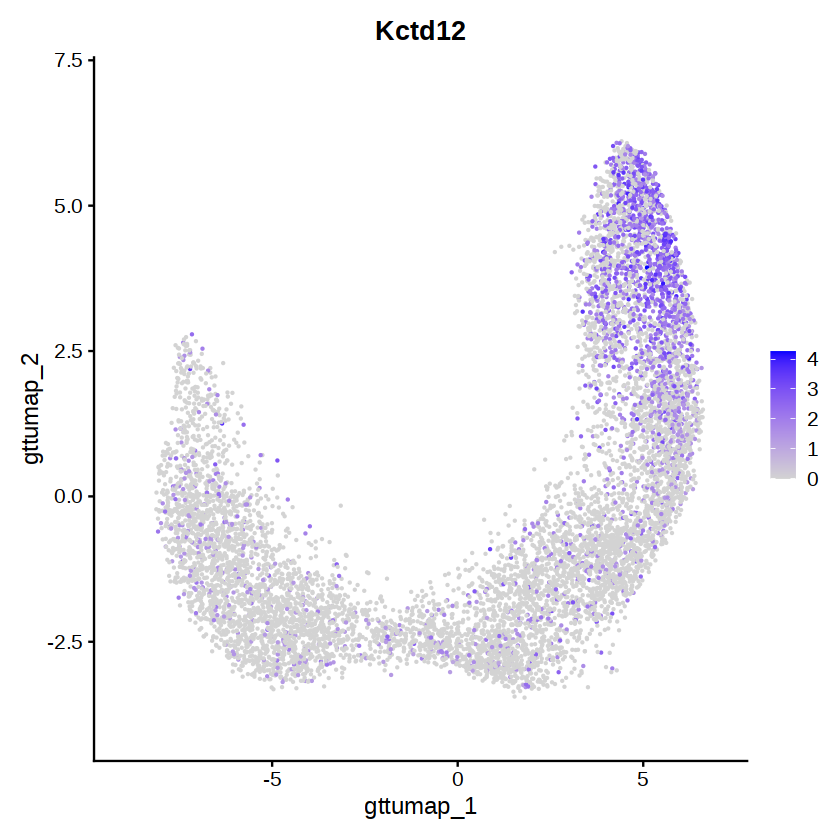

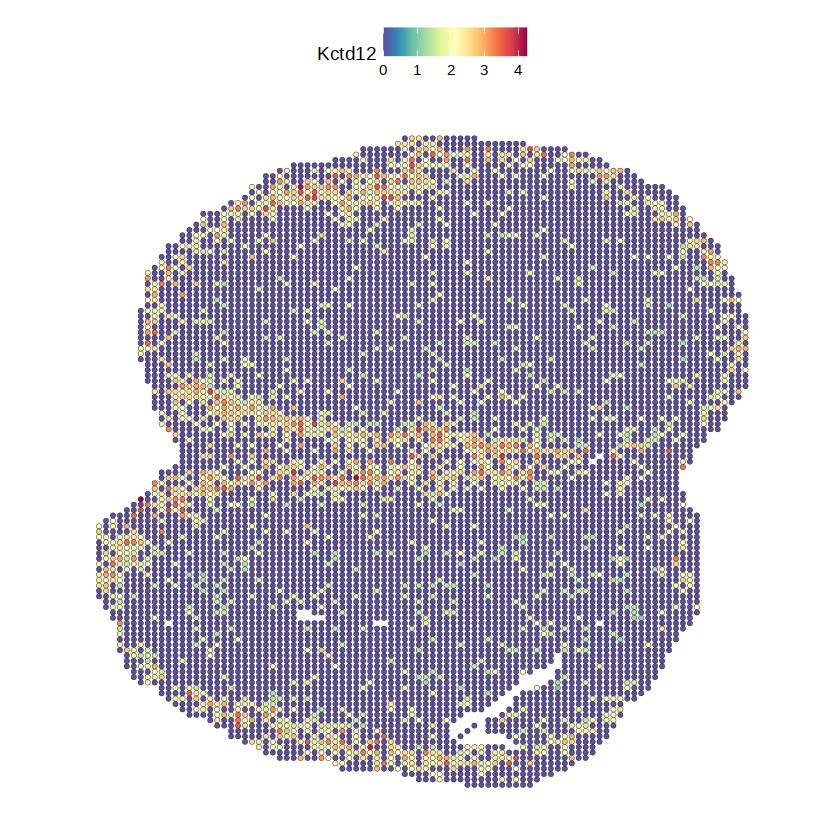

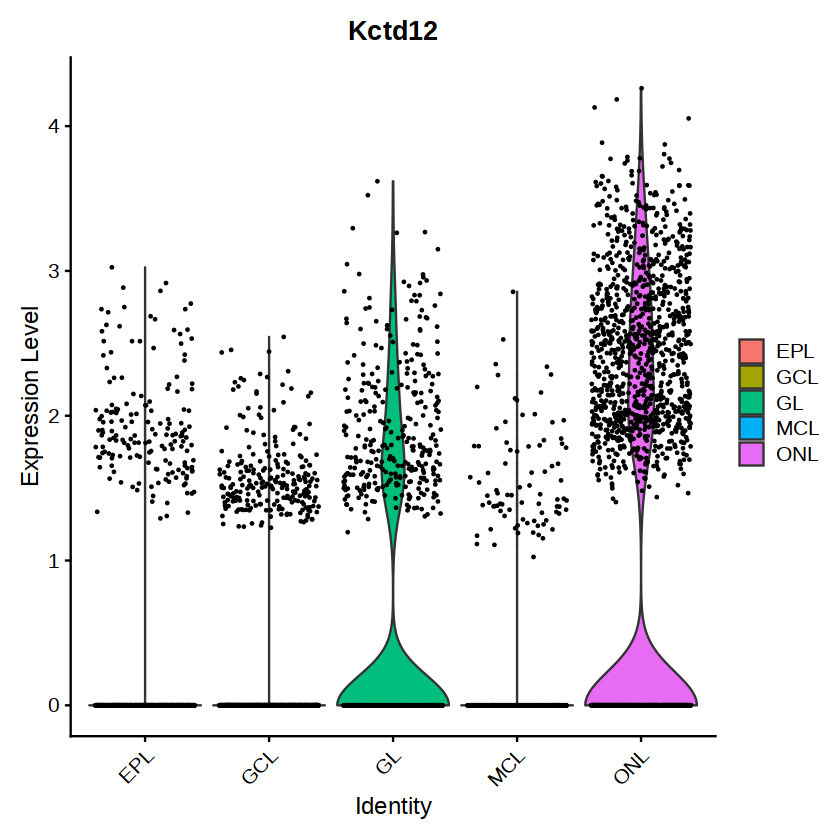

In [19]:
# ub=unique(obj$batch)
# obj1=subset(obj,subset=batch==ub[1])
genes=c('Atp2b4','Mbp','Pcp4','Nrgn','Gabra1','Slc6a11','Kctd12')
gene=genes[7]
FeaturePlot(obj1,reduction='GTT.umap',features=gene)
SpatialFeaturePlot(obj1,features=gene)
VlnPlot(obj1,group.by='celltype',features=gene)

combine 10x

In [194]:
# samples=c("BGI","SlideV2","10X")
samples=c("BGI","SlideV2","scRNA")
count=read.csv(paste(dirs,'gtt_input/',samples[1],"_mat.csv",sep=""),header=T,row.names=1,sep=',')
meta=read.csv(paste(dirs,'gtt_input/',samples[1],"_meta.csv",sep=""),header=T,row.names=1,sep=',')
# coord=read.csv(paste(dirs,"gtt_input/",samples[1],"_coord.csv",sep=""),header=T,row.names=1,sep=',')
flags=paste("_",samples[1],sep="")
for(i in 2:length(samples)){
    count=rbind(count,read.csv(paste(dirs,'gtt_input/',samples[i],"_mat.csv",sep=""),header=T,row.names=1,sep=','))
    meta=rbind(meta,read.csv(paste(dirs,'gtt_input/',samples[i],"_meta.csv",sep=""),header=T,row.names=1,sep=','))
#     coord=rbind(coord,read.csv(paste(dirs,"gtt_input/",samples[i],"_coord.csv",sep=""),header=T,row.names=1,sep=','))
    flags=paste(flags,"_",samples[i],sep="")
}
count=as(as.matrix(t(count)),'dgCMatrix')
obj_combine<-CreateSeuratObject(counts=count,min.cells=0, min.features=0,meta.data=meta)
VariableFeatures(obj_combine)<-rownames(obj_combine)
obj_combine@assays$RNA@scale.data=as.matrix(count)
# obj_combine@images$image <- new(
#     Class = 'SlideSeq',
#     assay = "Spatial",
#     key = "image_",
#     coordinates = coord
#  )
obj_combine<-subset(obj_combine,subset=celltype!='Low_Quality')
obj_combine$celltype[obj_combine$celltype=='SEZ']='GCL'
obj_combine$celltype[obj_combine$celltype=='Meninges']='ONL'
obj_combine$celltype[obj_combine$celltype=='OPL']='EPL'
obj_combine$celltype[obj_combine$celltype=='GCL_1']='GCL'
obj_combine$celltype[obj_combine$celltype=='GCL_2']='GCL'
obj_combine$celltype[obj_combine$celltype=='GL_1']='GL'
obj_combine$celltype[obj_combine$celltype=='GL_2']='GL'
cells=colnames(obj_combine@assays$RNA@counts)

In [195]:
clust1=read.csv(paste(dirs,'metrics/louvain_clust_BGI_SlideV2.csv',sep=""),row.names=1,header=T)
clust2=read.csv(paste(dirs,'metrics/',samples[3],'_expression_pred_clusters.csv',sep=""),row.names=1,header=T)
colnames(clust1)<-'clust';colnames(clust2)<-'clust';clust<-rbind(clust1,clust2)
obj_combine$gtt<-clust[cells,1]
clust1<-read.csv(paste(dirs,'metrics/seurat_louvain_clust_BGI_SlideV2.csv',sep=""),row.names=1,header=T)
clust2=read.csv(paste(dirs,'metrics/seurat_',samples[3],'_pred_clusters.csv',sep=""),row.names=1,header=T)
colnames(clust1)<-'clust';colnames(clust2)<-'clust';clust<-rbind(clust1,clust2)
obj_combine$seurat<-clust[cells,1]

In [206]:
# cells=colnames(obj_combine@assays$RNA@data)
# embed1=read.csv(paste(dirs,"gtt_output/AGC_embed",flags,"_expression_xent.csv",sep=""),header=T,row.names=1)
# if(dim(embed1)[2]==16){
#     znoise_dim=3}else{
#     znoise_dim=5
# }
# embed1=embed1[,znoise_dim:dim(embed1)[2]]
# obj_combine[['GTT']]<-CreateDimReducObject(embeddings=as.matrix(embed1), key = "GTT_", assay = DefaultAssay(obj_combine))
# obj_combine <-RunUMAP(obj_combine, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")
# embed2=read.csv(paste(dirs,"methods/seurat_mat",flags,"_expression.txt",sep=""),header=T,row.names=1)
# embed2=embed2[,]
# obj_combine[['Seurat']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "Seurat_", assay = DefaultAssay(obj_combine))

# obj_combine <-RunUMAP(obj_combine, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")
# obj_combine <-RunUMAP(obj_combine, reduction = "Seurat",dims=1:dim(embed2)[2],reduction.name="Seurat.umap")

In [207]:
########scRNA 细胞类型的分布#########
obj1<-subset(obj_combine,subset=batch=='scRNA')
stat=data.frame(celltype=0,freq=0,domain=0)
cc=as.data.frame(table(obj1$celltype))
rownames(cc)<-cc[,1]
clusters=c('7','3','1','5','4','0','2')
domains=c('RMS','GCL_1','GCL_2','MCL','EPL','GL','ONL')

for(i in 1:length(clusters)){
    clust=clusters[i]
    a=as.data.frame(table(obj1$celltype[which(obj1$gtt==clust)]))
    a[,1]<-as.character(a[,1])
    a[,2]=a[,2]/cc[a[,1],2]
    a[,2]=a[,2]/sum(a[,2])
    a$domain=paste(clust,'-',domains[i],sep='')
    colnames(a)<-c('celltype','freq','domain')
    stat<-rbind(stat,a)
}
stat<-stat[-1,]
stat1 = stat %>% group_by(domain) %>% mutate(position = rank(-freq))
stat1$domain<-factor(stat1$domain,levels=paste(clusters,domains,sep="-"))
stat1$celltype<-factor(stat1$celltype,levels=c('Mitral_and_tufted_cell','External_plexiform_layer_interneuron','Immature',
                                             'Granule_cell','Astrocytelike','Olfactory_sensory_neuron','Transition','Periglomerular_cell'))
png(paste(dirs,'fig/scRNA_celltype_compositions.png',sep=""),width=1000,height=900,res=500)
p<-ggplot(stat1, aes(x=domain,y=freq,fill=reorder(celltype,-freq),group=position))+geom_bar(stat='identity',lwd=0.1,position='dodge')+
scale_fill_npg()+
labs(fill='Cell Type')+xlab('Domain')+ylab('Normalized Percentages')+theme_bw()+
theme(axis.text.x=element_text(size=4, face="bold",colour = "black"),
      axis.text.y=element_text(size=4, face="bold",colour = "black"),
      axis.title.x=element_text(size=5,face="bold", colour = "black"),
      axis.title.y=element_text(size=5, face="bold",colour = "black"),
#       plot.title=element_text(face="bold", size=5, colour = "black",hjust=0.5),
      plot.title=element_blank(),
      legend.text=element_text(size=4, colour = "black",face="bold"),
      legend.title=element_text(size=5,face="bold", colour = "black"),
      panel.border = element_blank(),
      panel.grid.major=element_blank(),
      panel.grid.minor=element_blank(),
      axis.line=element_line(size=0.3, colour = "black"),
      axis.ticks=element_line(size=0.3, colour = "black"),
#      legend.position="right",
      legend.position="None",
     legend.direction="vertical",
      legend.spacing.x = unit(0.05, 'cm'),
     legend.key.size = unit(0.1, 'cm'), 
     legend.key.height = unit(0.1, 'cm'),
     legend.key.width = unit(0.1, 'cm'),
     legend.box.margin=margin(-12,-12,-12,-12),
     strip.text = element_text(size = 5,face="bold",colour = "black"),
    strip.background=element_blank()
     )+
guides(fill=guide_legend(nrow=2,byrow=TRUE))
print(p)
dev.off()

png 
  2

In [160]:
pdf(paste(dirs,'fig/scRNA_celltype_compositions_legend.pdf',sep=""),height=2.5,useDingbats=FALSE)
p<-ggplot(stat1, aes(x=domain,y=freq,fill=reorder(celltype,-freq),group=position))+geom_bar(stat='identity',lwd=0.1,position='dodge')+
scale_fill_npg()+
labs(fill='Cell Type')+xlab('Domain')+ylab('Normalized Percentages')+theme_bw()+
theme(axis.text.x=element_text(size=8, colour = "black"),
      axis.text.y=element_text(size=8, colour = "black"),
      axis.title.x=element_text(size=10, colour = "black"),
      axis.title.y=element_text(size=10, colour = "black"),
      plot.title=element_text(face="plain", size=10, colour = "black",hjust=0.5),
      legend.text=element_text(size=9, colour = "black",face="plain"),
      legend.title=element_text(size=12, colour = "black",face="plain"),
      panel.border = element_blank(),
      panel.grid.major=element_blank(),
      panel.grid.minor=element_blank(),
      axis.line=element_line(size=0.3, colour = "black"),
      axis.ticks=element_line(size=0.3, colour = "black"),
      aspect.ratio = 1,
      legend.direction = "vertical", legend.box = "horizontal",
      legend.position='right',
      legend.key.size = unit(0.5, "cm"))
print(p)
dev.off()

png 
  2

In [57]:
clust1=read.csv(paste(dirs,'metrics/louvain_clust_BGI_SlideV2.csv',sep=""),row.names=1,header=T)
clust2=read.csv(paste(dirs,'metrics/',samples[3],'_expression_pred_clusters.csv',sep=""),row.names=1,header=T)
colnames(clust1)<-'clust';colnames(clust2)<-'clust';clust<-rbind(clust1,clust2)
obj_combine$gtt<-clust[cells,1]
clust1<-read.csv(paste(dirs,'metrics/seurat_louvain_clust_BGI_SlideV2.csv',sep=""),row.names=1,header=T)
clust2=read.csv(paste(dirs,'metrics/seurat_',samples[3],'_pred_clusters.csv',sep=""),row.names=1,header=T)
colnames(clust1)<-'clust';colnames(clust2)<-'clust';clust<-rbind(clust1,clust2)
obj_combine$seurat<-clust[cells,1]
# clust<-read.csv(paste(dirs,'metrics/harmony_louvain_clust',flags,'.csv',sep=""),row.names=1,header=T)
# obj_combine$harmony<-clust[cells,1]
# clust<-read.csv(paste(dirs,'metrics/SEDR_louvain_clust',flags,'.csv',sep=""),row.names=1,header=T)
# obj_combine$sedr<-clust[cells,1]
# clust<-read.csv(paste(dirs,'metrics/STAGATE_louvain_clust',flags,'.csv',sep=""),row.names=1,header=T)
# obj_combine$stagate<-clust[cells,1]
# ari=data.frame(method=c('GraphSCIDRL','seurat','harmony_STAGATE','harmony_SEDR','harmony'),
#               ARI_louvain=c(ARI(obj_combine$gtt,obj_combine$celltype),ARI(obj_combine$seurat,obj_combine$celltype),
#                             ARI(obj_combine$stagate,obj_combine$celltype),
#                             ARI(obj_combine$sedr,obj_combine$celltype),ARI(obj_combine$harmony,obj_combine$celltype)))
# write.csv(ari,paste(dirs,'metrics/ARI_louvain',flags,'_expression.csv',sep=""))
write.csv(as.data.frame(obj_combine$gtt),paste(dirs,'metrics/louvain_clust',flags,'_expression.csv',sep=""))

In [44]:
obj1=subset(obj_combine,subset=batch==samples[3])
ARI(obj1$gtt,obj1$celltype)
ARI(obj1$seurat,obj1$celltype)

Warning message:
“Adding image data that isn't associated with any assay present”


[1] 0.4887375

[1] 0.5604219

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



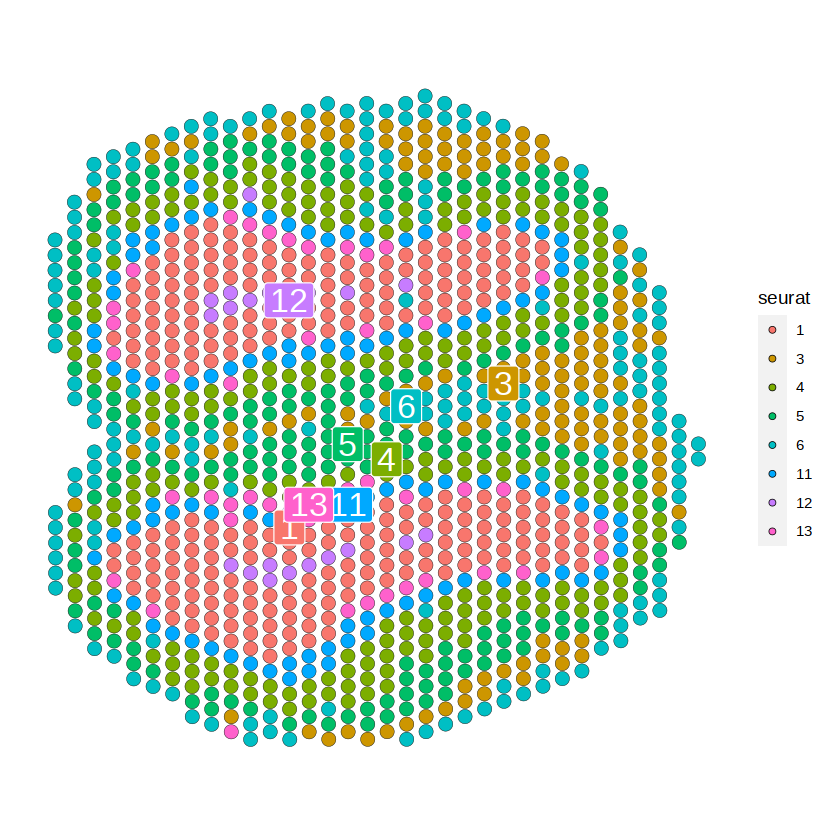

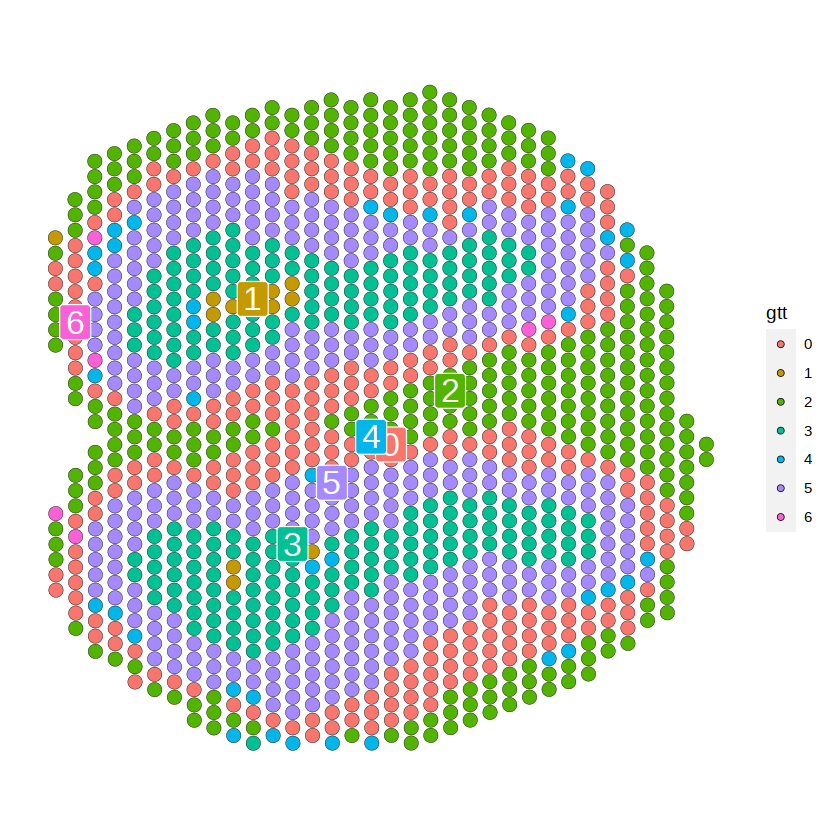

In [46]:
SpatialDimPlot(obj1,group.by="seurat",label=T,pt.size=5)
SpatialDimPlot(obj1,group.by="gtt",label=T,pt.size=5)

In [43]:
embed1=read.csv(paste(dirs,"gtt_output/AGC_embed",flags,"_xent.csv",sep=""),header=T,row.names=1)
if(dim(embed1)[2]==16){
    znoise_dim=3}else{
    znoise_dim=5
}
embed1=embed1[cells,znoise_dim:dim(embed1)[2]]
obj_combine[['GTT']]<-CreateDimReducObject(embeddings=as.matrix(embed1), key = "GTT_", assay = DefaultAssay(obj_combine))
obj_combine <-RunUMAP(obj_combine, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")


18:12:39 UMAP embedding parameters a = 0.9922 b = 1.112

18:12:39 Read 28484 rows and found 28 numeric columns

18:12:39 Using Annoy for neighbor search, n_neighbors = 30

18:12:39 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:12:45 Writing NN index file to temp file /tmp/RtmpZu9A5w/file3d845b96c221

18:12:45 Searching Annoy index using 1 thread, search_k = 3000

18:13:00 Annoy recall = 100%

18:13:01 Commencing smooth kNN distance calibration using 1 thread

18:13:03 Initializing from normalized Laplacian + noise

18:13:04 Commencing optimization for 200 epochs, with 1414704 positive edges

18:13:57 Optimization finished



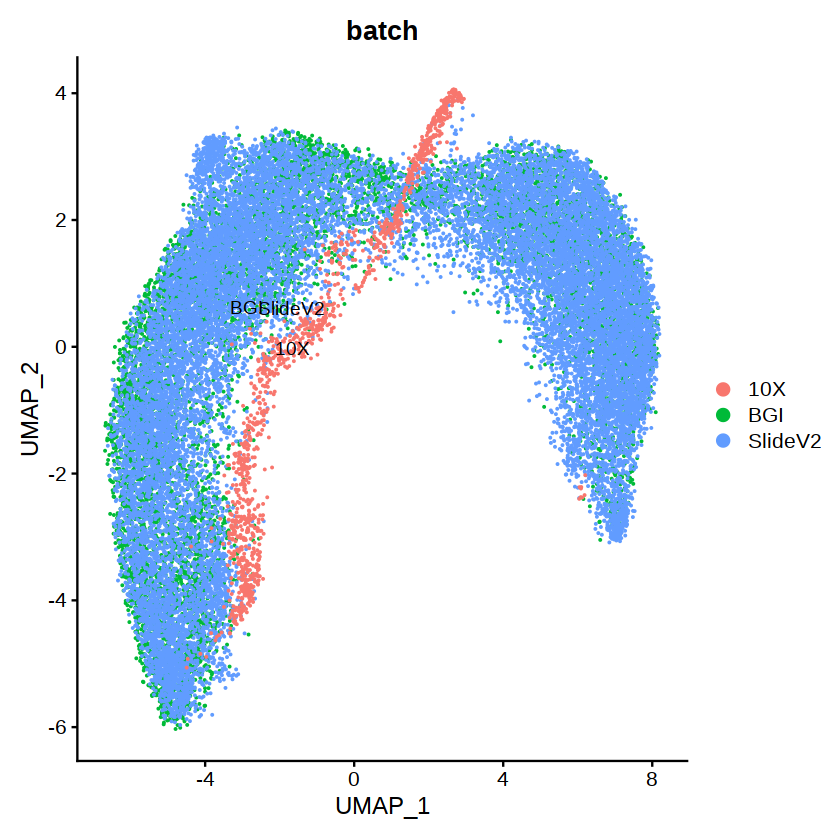

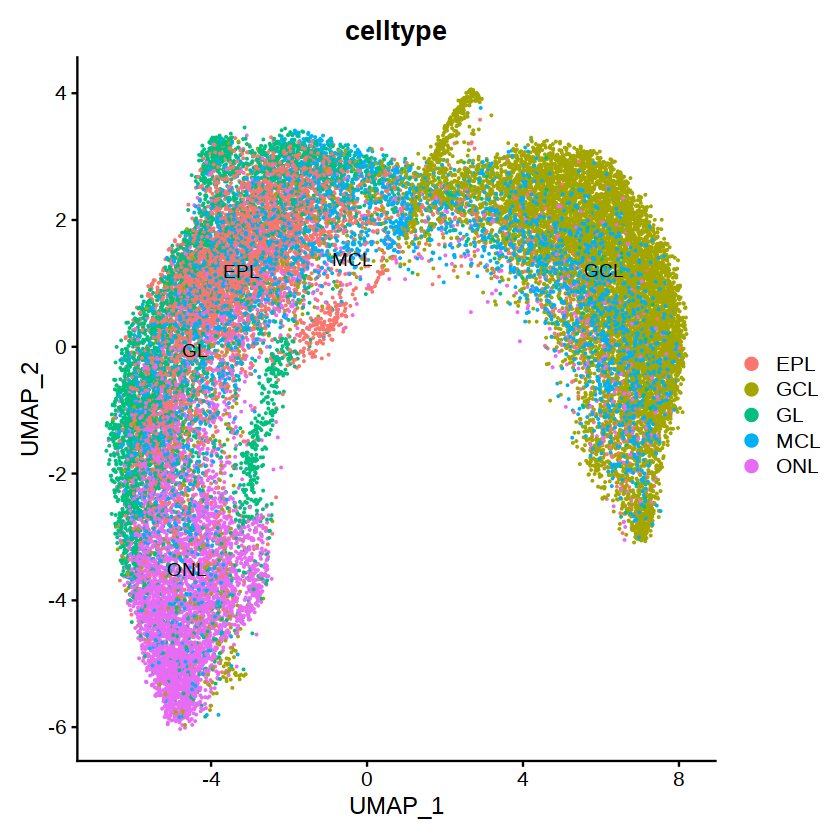

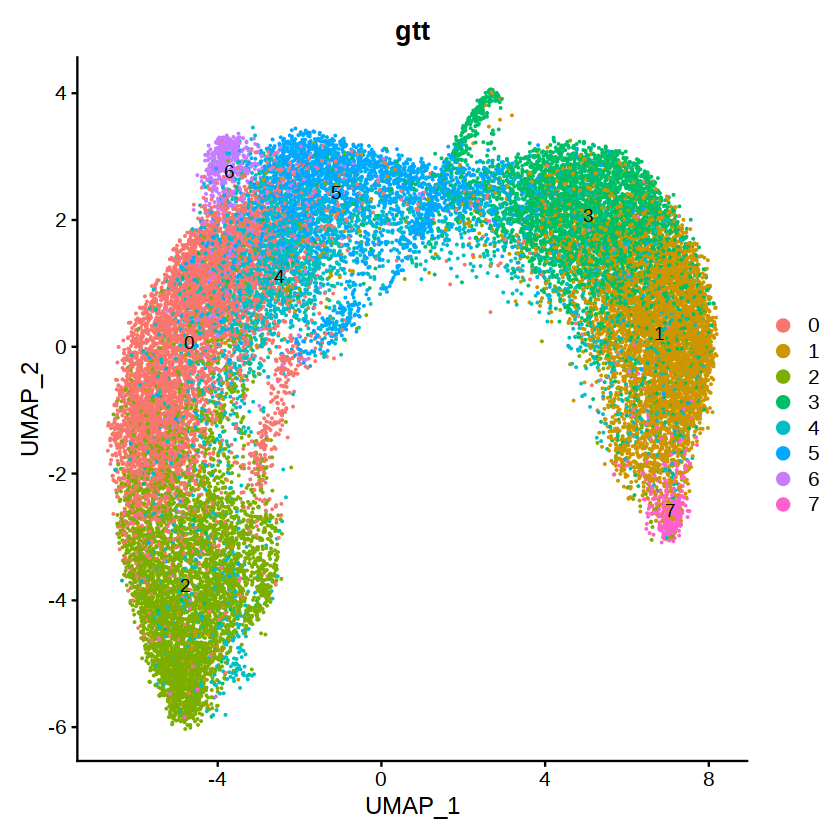

In [44]:
DimPlot(obj_combine,group.by="batch",label=T,reduction='GTT.umap')
DimPlot(obj_combine,group.by="celltype",label=T,reduction='GTT.umap')
DimPlot(obj_combine,group.by="gtt",label=T,reduction='GTT.umap')

Warning message:
“Adding image data that isn't associated with any assay present”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



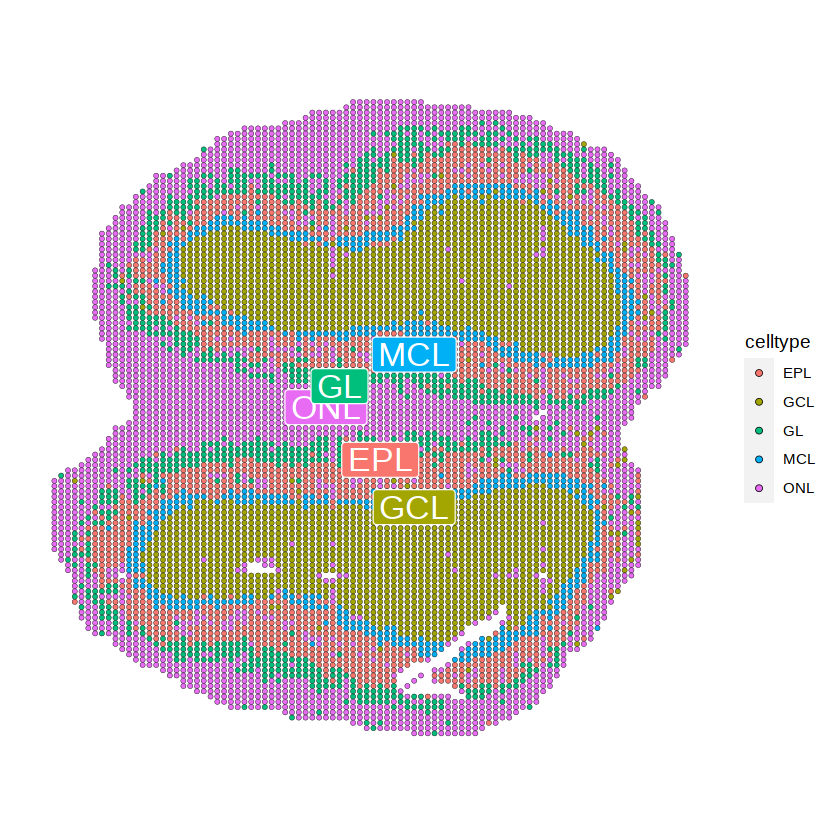

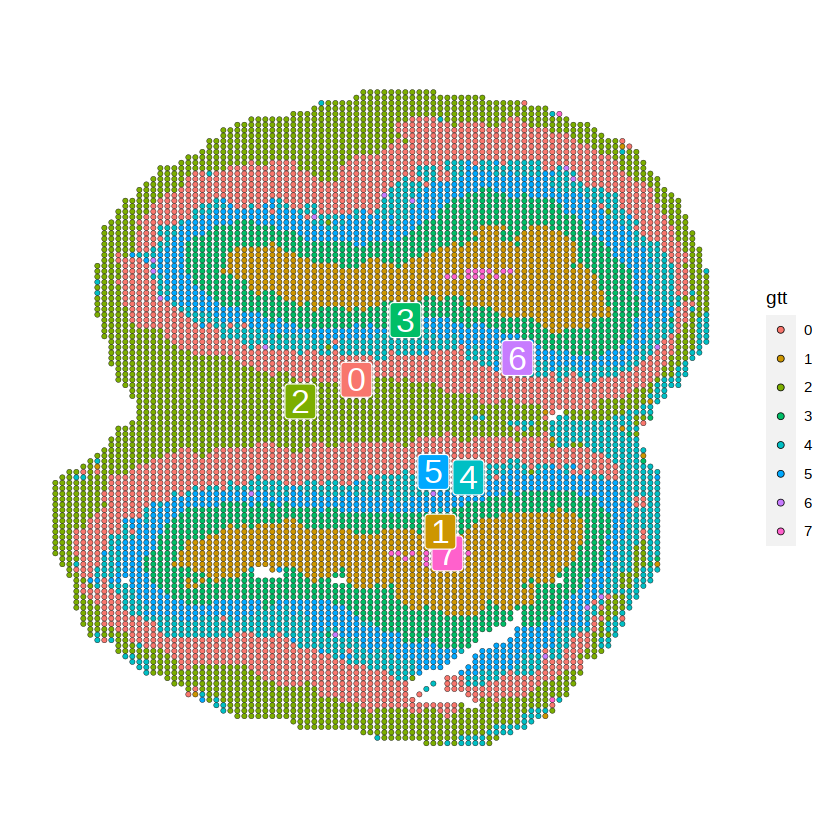

In [54]:
ub<-unique(obj_combine$batch)
obj1<-subset(obj_combine,subset=batch==ub[1])
SpatialDimPlot(obj1,group.by="celltype",label=T)
SpatialDimPlot(obj1,group.by="gtt",label=T)